# `00` Preparing the Invironment and Loading Data

Due to the large number of files (images/labels) found in the dataset folder, copying them from Drive to the current working directory can take a very long time. For this reason, zipping the dataset folder once and then downloading and unzipping the dataset can be much faster and save time.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!cp /content/drive/MyDrive/FootballObjectDetetction/dataset.zip ./
!unzip -q ./dataset.zip && rm ./dataset.zip
!mv /content/content/drive/MyDrive/Yolo_soccer/soccerNet_yolo8_dataset_new ./Data/
!rm -r /content/content/

In [ ]:
DATA_PATH = './Data/'
TRAIN_SET_PATH = DATA_PATH + 'train/'
VAL_SET_PATH = DATA_PATH + 'val/'
TEST_SET_PATH = DATA_PATH + 'test/'

In [ ]:
!pip -q install ultralytics

# `01` Data Exploration

## `a)` First, we look for the labels found in the dataset.

In [ ]:
import yaml
with open(DATA_PATH + 'data.yaml') as f:
  data = yaml.safe_load(f)
  labels = data['names']

print("Labels are:")
for i, label in enumerate(labels):
  print(str(i) + ' - ' + label)

Labels are:
0 - Player team left
1 - Player team right
2 - Goalkeeper team left
3 - Goalkeeper team right
4 - Ball
5 - Main referee
6 - Side referee
7 - Staff members


## `b)` Finding out the train/val/test split of the data

In [ ]:
import os

train_images_count =  len(os.listdir(TRAIN_SET_PATH + 'images/'))
validation_images_count = len(os.listdir(VAL_SET_PATH + 'images/'))
test_images_count = len(os.listdir(TEST_SET_PATH + 'images/'))

print("Train set images count: ", train_images_count)
print("Validation set images count: ", validation_images_count)
print("Test set images count: ", test_images_count)

Train set images count:  10212
Validation set images count:  1276
Test set images count:  1276


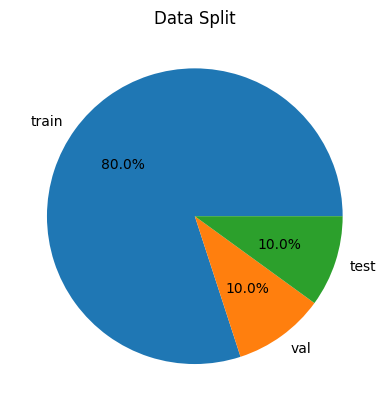

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

data = np.array([train_images_count, validation_images_count, test_images_count])
plt.pie(data,
        labels=['train', 'val', 'test'],
        autopct='%1.1f%%')
plt.title('Data Split')
plt.show();

## `c)` Loading random images from the training set and drawing their bouning boxes and labels

12566.png


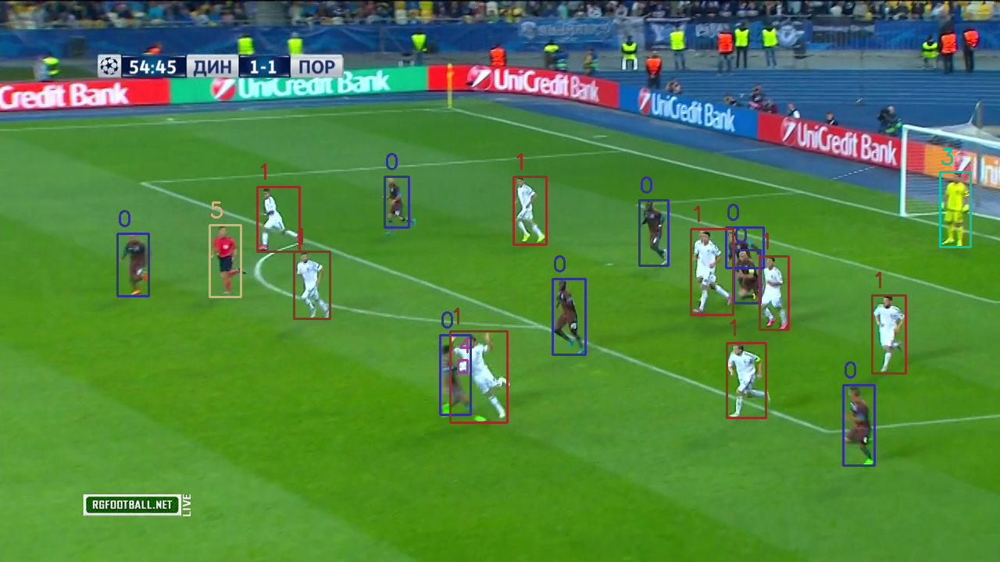

9027.png


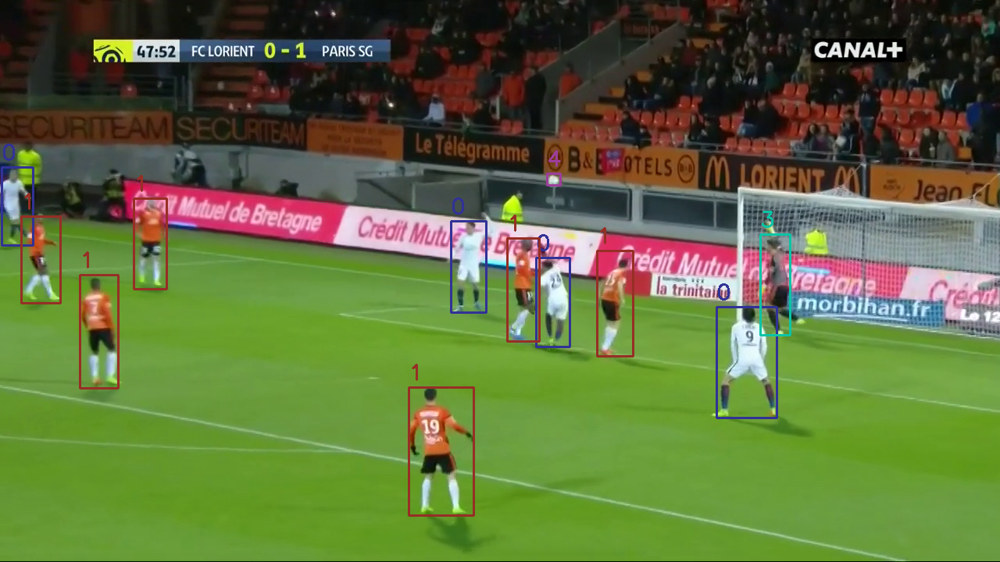

7455.png


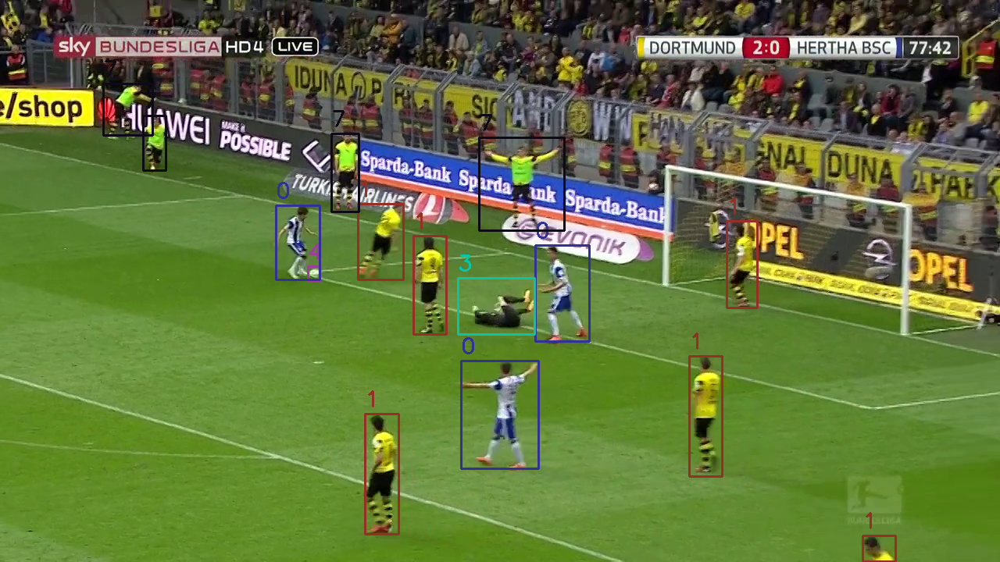

12313.png


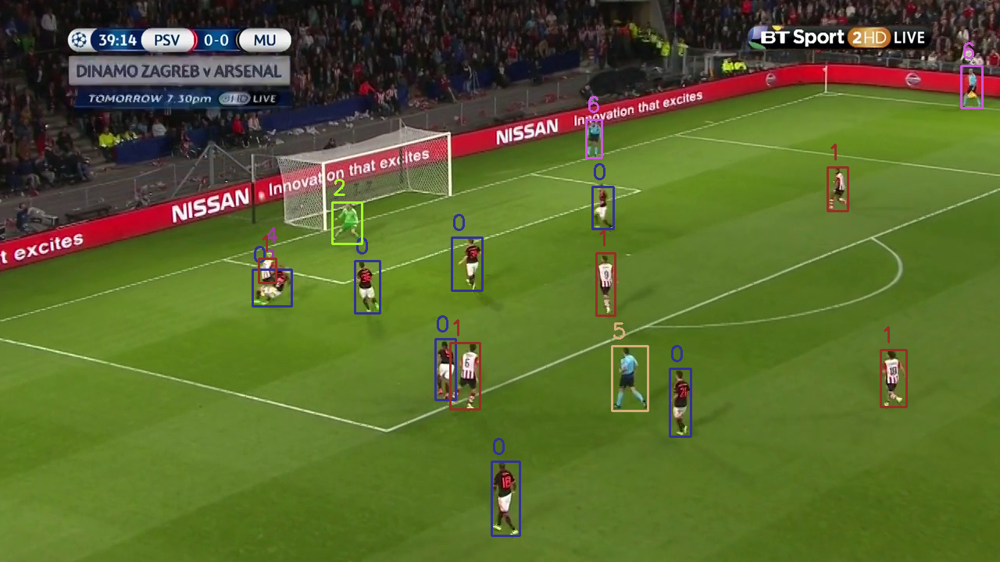

756.png


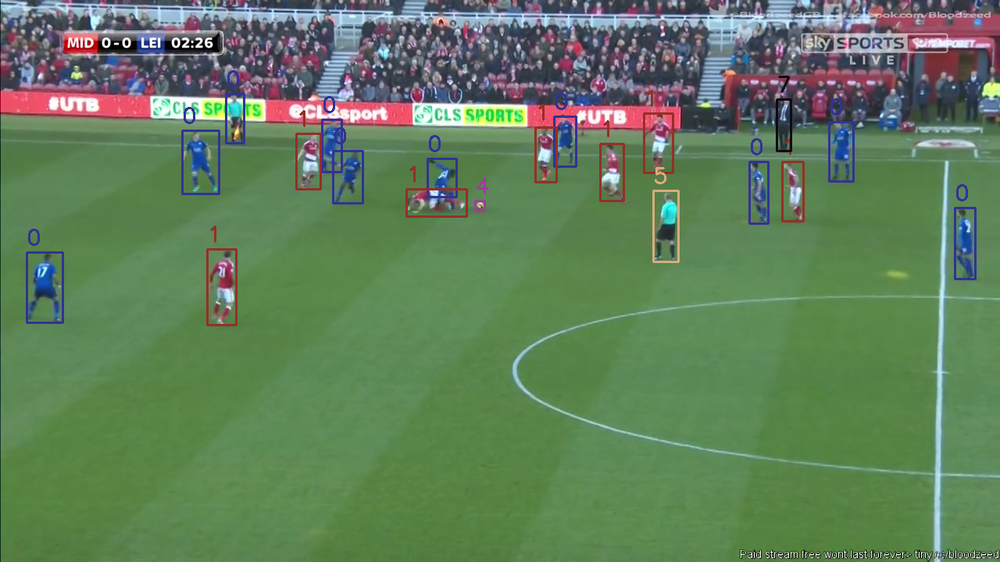

In [ ]:
import os
import random
random.seed(15)
import cv2
from google.colab.patches import cv2_imshow

box_colors = {
    "0": (150, 50, 50),
    "1": (37, 47, 150),
    "2": (41, 248, 165),
    "3": (166, 196, 10),
    "4": (155, 62, 157),
    "5": (123, 174, 213),
    "6": (217, 89, 204),
    "7": (22, 11, 15)
}

train_images_names = os.listdir(TRAIN_SET_PATH + 'images/')
random_images = random.sample(train_images_names, k=5)

for img_name in random_images:
  print(img_name)
  img = cv2.imread(TRAIN_SET_PATH + 'images/' + img_name)

  with open(TRAIN_SET_PATH + 'labels/' + img_name.split('.')[0] + '.txt') as f:
    bounding_boxes = f.readlines()

  for box in bounding_boxes:
    box = box.strip().split()
    label, x, y, w, h = int(box[0]), float(box[1]), float(box[2]), float(box[3]), float(box[4])

    # Convert YOLO format to OpenCV format
    x1 = int((x - w / 2) * img.shape[1])
    y1 = int((y - h / 2) * img.shape[0])
    x2 = int((x + w / 2) * img.shape[1])
    y2 = int((y + h / 2) * img.shape[0])

    # Draw the bounding box and label
    cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[str(label)], 2)
    cv2.putText(img, str(label), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[str(label)], 2)

  cv2_imshow(img);

## `d`) Finding the count for each label in the training set

In [ ]:
from collections import Counter
from tqdm import tqdm
import matplotlib.pyplot as plt

labels_dir = TRAIN_SET_PATH + 'labels/'
label_freq = [0] * len(labels)
scales = []
aspect_ratios = []
label_scale = [0] * len(labels)

for labels_file in tqdm(os.listdir(labels_dir)):
    # Load the bounding box information from the current file
    with open(os.path.join(labels_dir, labels_file), 'r') as f:
        bounding_boxes = f.readlines()

    # Update the information
    for box in bounding_boxes:
        box = box.strip().split()
        label, w, h = int(box[0]), float(box[3]), float(box[4])

        scale = w * h
        aspect_ratio = w/h

        label_freq[label] += 1
        scales.append(scale)
        label_scale[label] += scale
        aspect_ratios.append(aspect_ratio)

# Print the label frequencies
print()
print('#' * 100)
for label, freq in enumerate(label_freq):
    print(f'{labels[label]}: {freq}')

100%|██████████| 10212/10212 [00:01<00:00, 7318.70it/s]


####################################################################################################
Player team left: 60852
Player team right: 60915
Goalkeeper team left: 3729
Goalkeeper team right: 3449
Ball: 7798
Main referee: 7146
Side referee: 5361
Staff members: 2211


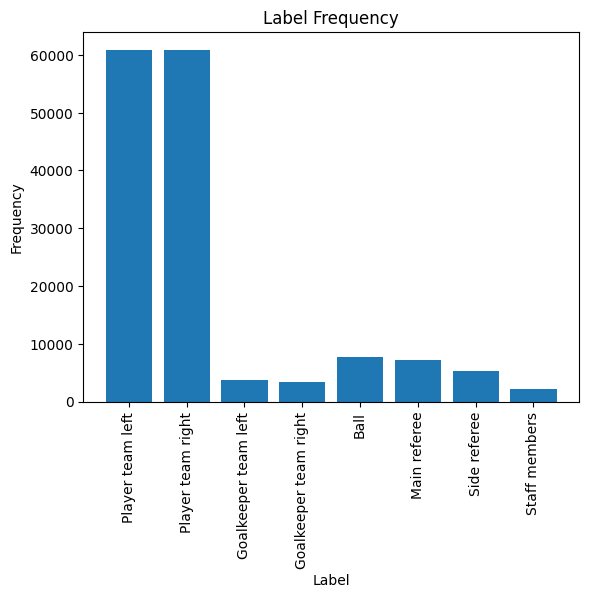

In [ ]:
plt.bar(labels, label_freq)
plt.xlabel('Label')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.title("Label Frequency")
plt.show()

We can see that "Players" are the most dominant class in the dataset and has a very large ratio compared to other classes.

## `e)` Exploring the bounding boxes scales

First I looked for the most frequent scale ranges

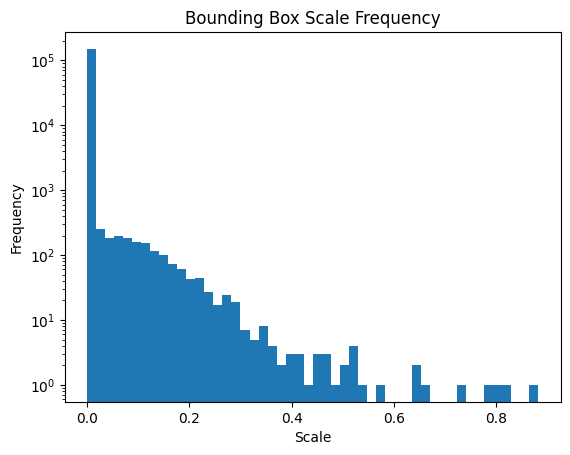

In [ ]:
plt.hist(scales, bins=50)
plt.xlabel('Scale')
plt.ylabel('Frequency')
plt.yscale('log')
plt.title("Bounding Box Scale Frequency")
plt.show()

As expected most of the bounding boxes have a small scale as the players, ball, ... etc only take a small part in most of the images

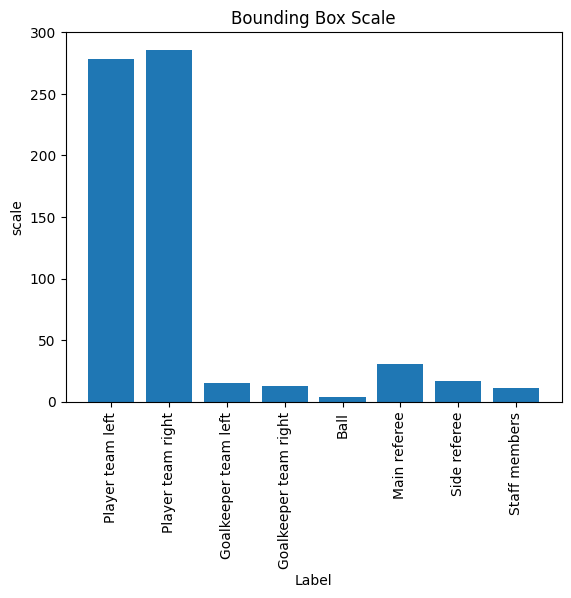

In [ ]:
plt.bar(labels, label_scale)
plt.xlabel('Label')
plt.ylabel('scale')
plt.xticks(rotation=90)
plt.title("Bounding Box Scale")
plt.show()

The ball class has the smallest scale compared to all other labels, therefore a small anchor might be needed when training the object detection model.

Then I looked for the most frequent aspect ratio values of the bounding boxes.

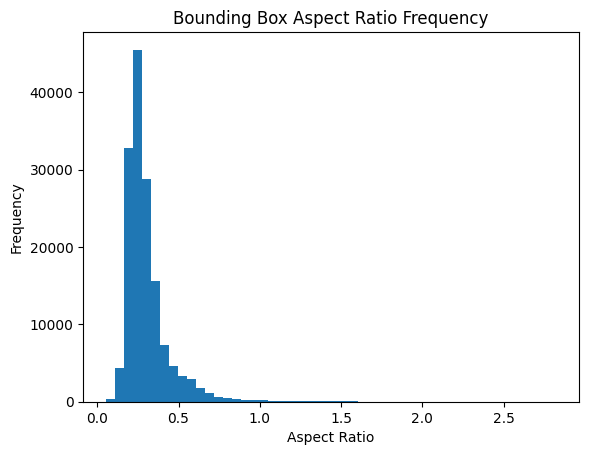

In [ ]:
plt.hist(aspect_ratios, bins=50)
plt.xlabel('Aspect Ratio')
plt.ylabel('Frequency')
plt.title("Bounding Box Aspect Ratio Frequency")
plt.show()

most of the bounding box are vertical as their aspect ratio < 1, which is expected since most of the boxes contain players that will mostly have vertical bounding boxes.

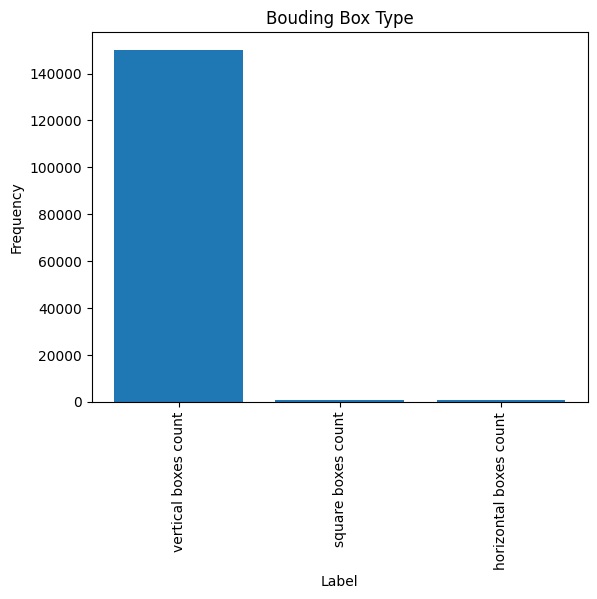

In [ ]:
vertical_boxes_count = np.sum([ratio < 0.9 for ratio in aspect_ratios])
square_boxes_count = np.sum([ratio > 0.9 and ratio < 1.1 for ratio in aspect_ratios])
horizontal_boxes_count = np.sum([ratio > 1.1 for ratio in aspect_ratios])

plt.bar(['vertical boxes count', 'square boxes count', 'horizontal boxes count'],
        [vertical_boxes_count, square_boxes_count, horizontal_boxes_count])
plt.xlabel('Label')
plt.ylabel('Frequency')
plt.xticks(rotation=90)
plt.title("Bouding Box Type")
plt.show()

## `f)` Finding out the resolution of the images

In [ ]:
from collections import Counter
from tqdm import tqdm
import matplotlib.pyplot as plt
import os

images_dir = TRAIN_SET_PATH + 'images/'
resolutions = Counter()

for image_name in tqdm(os.listdir(images_dir)):
    image = plt.imread(images_dir + image_name)
    h, w = image.shape[: 2]
    resolutions[(w, h)] += 1

# Print the label frequencies
print()
print('#' * 100)
for resolution, freq in resolutions.items():
    print(f'{resolution}: {freq}')

100%|██████████| 10212/10212 [05:42<00:00, 29.79it/s]


####################################################################################################
(1280, 720): 6877
(1920, 1080): 3237
(854, 480): 51
(1366, 768): 31
(704, 576): 16


# `02` Data Preprocessing

The preprocessing step requires merging both the "Left Team Player" and "Right Team Player" into one class and similarly perform the same step to the "Left Team GK" and "Right Team GK" classes.

## `a)` Updating the labels text files in both the training and validation sets

This can be done by loading each label.txt file in both folders and updating the labels according to a map that can be explained in the following figure

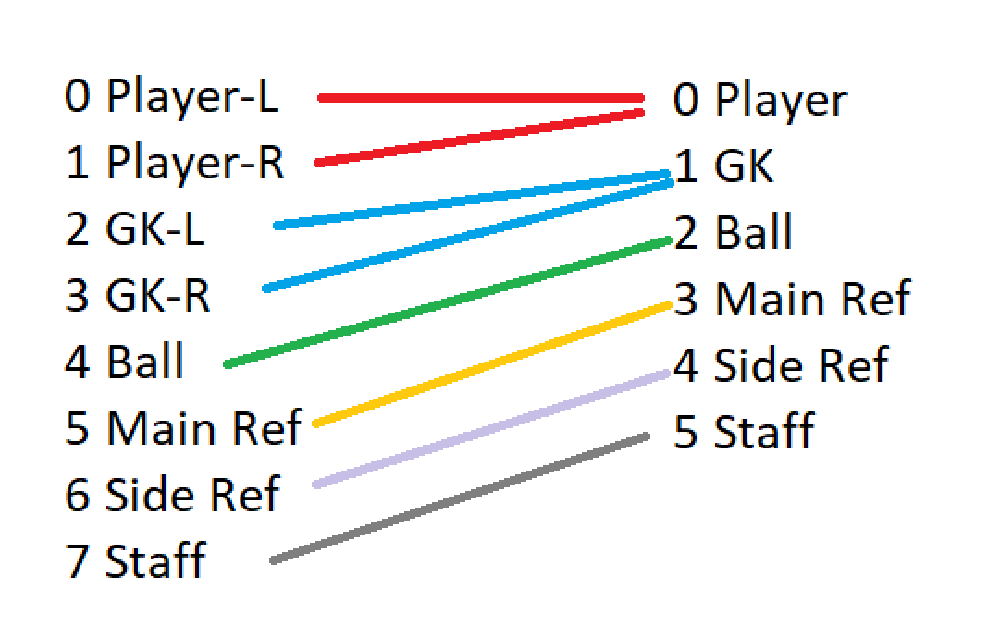

Loading a label file to check its contents

In [ ]:
with open('/content/Data/train/labels/1.txt', 'r') as f:
    lines = f.read()
print(lines)

4 0.35838020833333334 0.475375 0.011208333333333324 0.020564814814814796 
0 0.47624479166666667 0.43303703703703705 0.0199583333333333 0.09946296296296292 
0 0.47496875000000005 0.41456481481481483 0.02986458333333335 0.11533333333333333 
0 0.48367968749999996 0.46938888888888897 0.037838541666666656 0.09842592592592593 
0 0.8728984375 0.39079166666666665 0.015473958333333352 0.0915462962962963 
0 0.7112760416666667 0.490800925925926 0.025052083333333405 0.11345370370370374 
0 0.6857890624999999 0.39946759259259257 0.013942708333333324 0.0948425925925926 
0 0.27930208333333334 0.462712962962963 0.018552083333333337 0.07118518518518513 
0 0.6293828124999999 0.4403287037037037 0.019901041666666685 0.10287962962962964 
0 0.39029166666666665 0.4514768518518519 0.02106250000000003 0.0940648148148148 
0 0.4122369791666667 0.4826388888888889 0.045088541666666634 0.04137037037037038 
1 0.5997760416666666 0.5595046296296297 0.040625 0.12623148148148142 
1 0.9217604166666666 0.5098611111111111 0

In [ ]:
import os
from tqdm import tqdm

labels_mapping = {
    '0': '0',
    '1': '0',
    '2': '1',
    '3': '1',
    '4': '2',
    '5': '3',
    '6': '4',
    '7': '5'
}

for dataset_path in [TRAIN_SET_PATH, VAL_SET_PATH]:
  print('Working on ' + TRAIN_SET_PATH)
  labels_path = dataset_path + 'labels/'

  for label_file_name in tqdm(os.listdir(labels_path)):
    label_file_path = labels_path + label_file_name

    with open(label_file_path, 'r') as f:
      lines = f.readlines()

    with open(label_file_path, 'w') as f:
      for line in lines:
        label = line.split()[0]
        line = line.replace(label, labels_mapping[label], 1)
        f.write(line)
  print()

Working on ./Data/train/


100%|██████████| 10212/10212 [00:08<00:00, 1244.63it/s]



Working on ./Data/train/


100%|██████████| 1276/1276 [00:00<00:00, 1411.35it/s]

Checking the same file content after the updating step

In [ ]:
with open('/content/Data/train/labels/1.txt', 'r') as f:
    lines = f.read()
print(lines)

2 0.35838020833333334 0.475375 0.011208333333333324 0.020564814814814796 
0 0.47624479166666667 0.43303703703703705 0.0199583333333333 0.09946296296296292 
0 0.47496875000000005 0.41456481481481483 0.02986458333333335 0.11533333333333333 
0 0.48367968749999996 0.46938888888888897 0.037838541666666656 0.09842592592592593 
0 0.8728984375 0.39079166666666665 0.015473958333333352 0.0915462962962963 
0 0.7112760416666667 0.490800925925926 0.025052083333333405 0.11345370370370374 
0 0.6857890624999999 0.39946759259259257 0.013942708333333324 0.0948425925925926 
0 0.27930208333333334 0.462712962962963 0.018552083333333337 0.07118518518518513 
0 0.6293828124999999 0.4403287037037037 0.019901041666666685 0.10287962962962964 
0 0.39029166666666665 0.4514768518518519 0.02106250000000003 0.0940648148148148 
0 0.4122369791666667 0.4826388888888889 0.045088541666666634 0.04137037037037038 
0 0.5997760416666666 0.5595046296296297 0.040625 0.12623148148148142 
0 0.9217604166666666 0.5098611111111111 0

## `b)` Updating the YAML file

This can be done by loading the yaml file and updating both the classes count and the classes names

Loading the data.yaml file to check its content

In [ ]:
import yaml
with open(DATA_PATH + 'data.yaml') as f:
  data = yaml.safe_load(f)
  print(data)

{'names': ['Player team left', 'Player team right', 'Goalkeeper team left', 'Goalkeeper team right', 'Ball', 'Main referee', 'Side referee', 'Staff members'], 'nc': 8, 'roboflow': {'license': 'CC BY 4.0', 'project': 'teamsrefgkball-xrdyu', 'url': 'https://universe.roboflow.com/mohamed-badreldin-cp2tc/teamsrefgkball-xrdyu/dataset/5', 'version': 5, 'workspace': 'mohamed-badreldin-cp2tc'}, 'test': 'test/images', 'train': 'train/images', 'val': 'val/images'}


In [ ]:
new_labels = ['Player', 'GoalKeeper', 'Ball', 'Main Referee', 'Side Referee', 'Staff Member']

with open(DATA_PATH + 'data.yaml', 'r') as f:
  data = yaml.safe_load(f)
data['nc'] = len(new_labels)
data['names'] = new_labels
with open(DATA_PATH + 'data.yaml', 'w') as f:
  yaml.safe_dump(data, f)

Checking the data.yaml file content after the updating step

In [ ]:
import yaml
with open(DATA_PATH + 'data.yaml') as f:
  data = yaml.safe_load(f)
  print(data)

{'names': ['Player', 'GoalKeeper', 'Ball', 'Main Referee', 'Side Referee', 'Staff Member'], 'nc': 6, 'roboflow': {'license': 'CC BY 4.0', 'project': 'teamsrefgkball-xrdyu', 'url': 'https://universe.roboflow.com/mohamed-badreldin-cp2tc/teamsrefgkball-xrdyu/dataset/5', 'version': 5, 'workspace': 'mohamed-badreldin-cp2tc'}, 'test': 'test/images', 'train': 'train/images', 'val': 'val/images'}


# `03` Model Training

# `04` Model Inference

## `a)` Loading the model

In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO("/content/drive/MyDrive/FootballObjectDetection/yolov5/exp6/weights/last.pt")

## `b)` Running the model on a sample image and drawing the Labels and Bounding


image 1/1 /content/Data/train/images/11532.png: 416x736 11 Players, 1 GoalKeeper, 1 Main Referee, 1 Side Referee, 1813.8ms
Speed: 8.7ms preprocess, 1813.8ms inference, 6.8ms postprocess per image at shape (1, 3, 416, 736)


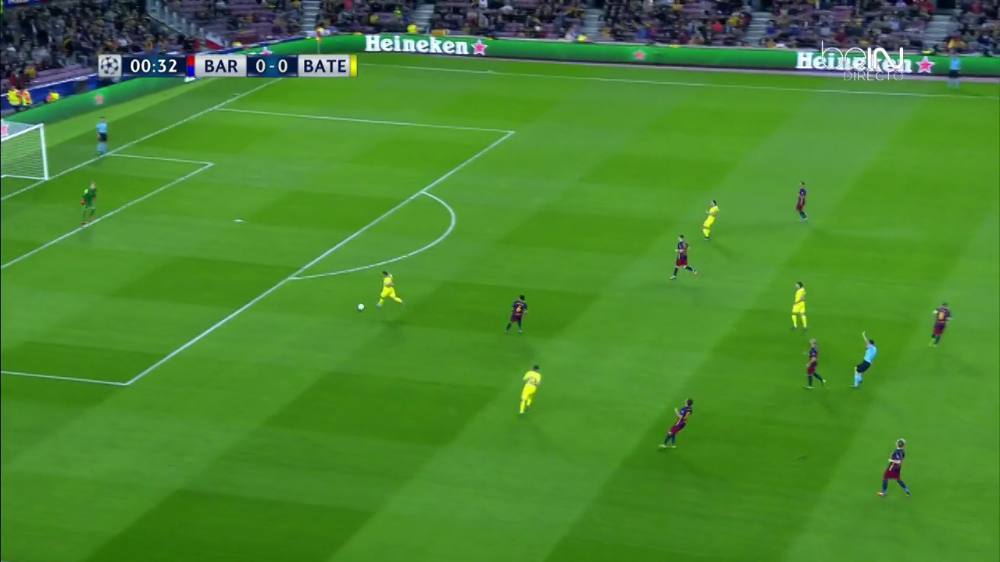

In [ ]:
from google.colab.patches import cv2_imshow
results = model.predict(source="/content/Data/train/images/11532.png", conf=0.5)
result = results[0]
cv2_imshow(result.orig_img)

In [ ]:
import random

random.seed(15)
box_colors = []
labels = ['Player', 'GK', 'Ball', 'Main Ref', 'Side Ref', 'Staff']
for label in labels:
  box_colors.append(tuple(random.randint(0, 255) for _ in range(3)))

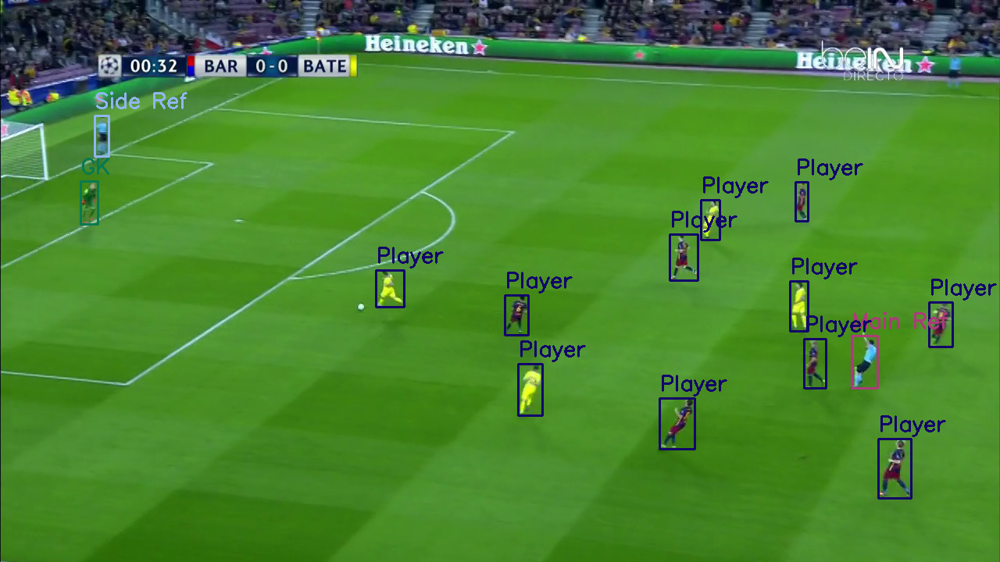

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

img = result.orig_img.copy()

for box in result.boxes:
  label = int(box.cls.numpy()[0])
  x1, y1, x2, y2 = map(int, box.xyxy[0].numpy())

  # Draw the bounding box and label
  cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[int(label)], 2)
  cv2.putText(img, labels[label], (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[int(label)], 2)

cv2_imshow(img);

# `05` Post Processing

In the post processing step, it's required to classify each player back into either "Left Team Player" and "Right Team Player" and perform a similar step to both Goalkeepers.

Let's start with classifying the players. for this step, I will ask a very simple question.
\
How can humans differntiate the players of the two teams ?
\
ofcourse, according to their kit colors.
\
Similarly, the algorithm performs a similar step to classify the players. First, it works by isolating the players from the image, then we find the kit color of each player. Afterwards, players with similar kit colors are grouped together into one team.

Different matches can have different grass color due to light variations and various stadiums grass patterns. This can cause a problem when we try to remove the grass color from the players images.

Therefore, the first thing we need to know is the grass color in each image. We can know this value by filtering out the green color from the image and getting its average value.

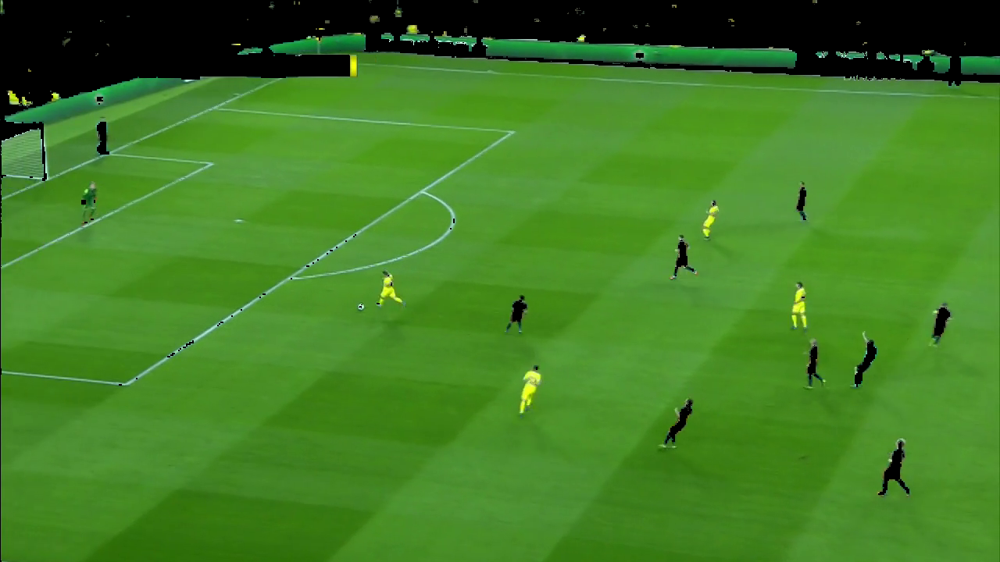

Grass BGR color:  (40.915368279374405, 142.65303015923297, 74.1716656785735)


In [ ]:
import numpy as np

# Convert image to HSV color space
img = result.orig_img.copy()
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define a large range of green color in HSV
lower_green = np.array([30, 40, 40])
upper_green = np.array([80, 255, 255])

# Threshold the HSV image to get only green colors
mask = cv2.inRange(hsv, lower_green, upper_green)

# Calculate the mean value of the pixels that are not masked
masked_img = cv2.bitwise_and(img, img, mask=mask)
cv2_imshow(masked_img)
grass_color = cv2.mean(img, mask=mask)
grass_color = grass_color[:3]
print("Grass BGR color: ", grass_color)

The next step is to extract each player from the image and  remove the grass from the background of each player by masking out the grass color ( using the average color that we found in the previous step ) and removing the bottom half of the image to remove any influence from the shorts color. Finally, we get the color of the kit by averaging out the remaining pixels

Player Kit Color: 


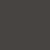

####################################################################################################


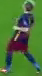

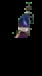

Player Kit Color: 


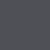

####################################################################################################


Player Kit Color: 


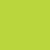

####################################################################################################


Player Kit Color: 


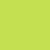

####################################################################################################


Player Kit Color: 


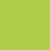

####################################################################################################


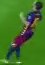

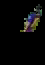

Player Kit Color: 


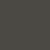

####################################################################################################


Player Kit Color: 


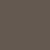

####################################################################################################


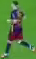

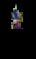

Player Kit Color: 


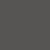

####################################################################################################


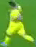

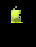

Player Kit Color: 


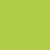

####################################################################################################


Player Kit Color: 


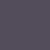

####################################################################################################


Player Kit Color: 


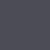

####################################################################################################


In [ ]:
kits_colors = []
grass_hsv = cv2.cvtColor(np.uint8([[list(grass_color)]]), cv2.COLOR_BGR2HSV)

for box in result.boxes:
  label = int(box.cls.numpy()[0])
  if label == 0:
    x1, y1, x2, y2 = map(int, box.xyxy[0].numpy())
    player_img = result.orig_img[y1: y2, x1: x2]
    cv2_imshow(player_img)
    # Convert image to HSV color space
    hsv = cv2.cvtColor(player_img, cv2.COLOR_BGR2HSV)

    # Define range of green color in HSV
    lower_green = np.array([grass_hsv[0, 0, 0] - 10, 40, 40])
    upper_green = np.array([grass_hsv[0, 0, 0] + 10, 255, 255])

    # Threshold the HSV image to get only green colors
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Bitwise-AND mask and original image
    mask = cv2.bitwise_not(mask)

    upper_mask = np.zeros(player_img.shape[:2], np.uint8)
    upper_mask[0:player_img.shape[0]//2, 0:player_img.shape[1]] = 255
    mask = cv2.bitwise_and(mask, upper_mask)

    masked_img = cv2.bitwise_and(player_img, player_img, mask=mask)
    cv2_imshow(masked_img)

    player_kit_color = np.array(cv2.mean(player_img, mask=mask)[:3])
    kits_colors.append(player_kit_color)

    print("Player Kit Color: ")
    demo_color = np.repeat(player_kit_color[np.newaxis, ...], 50, axis=0)
    demo_color = np.repeat(demo_color[np.newaxis, ...], 50, axis=0)
    cv2_imshow(demo_color)
    print('#' * 100)

The next step is to cluster the kits colors into 2 groups, each containing the kits that have a similar color to each other, and each group will represent one team.
\
This step can be performed by using a K-Means clustering algorithm on the kit colors list that we found in the previous step.

In [ ]:
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")

kits_kmeans = KMeans(n_clusters=2)
kits_kmeans.fit(kits_colors);

In [ ]:
kits_colors = np.array(kits_colors)

In [ ]:
import plotly.express as px

fig = px.scatter_3d(
    x=kits_colors[:, 2],
    y=kits_colors[:, 1],
    z=kits_colors[:, 0],
    range_x=[0, 255],
    range_y=[0, 255],
    range_z=[0, 255],
    title="Kits Colors"
    )
fig.update_traces(marker_size = 10)
fig.update_traces(marker_color = list(map(lambda e: (e[2], e[1], e[0]), kits_colors)))

fig.add_scatter3d(
    x=[kits_kmeans.cluster_centers_[0, 2]],
    y=[kits_kmeans.cluster_centers_[0, 1]],
    z=[kits_kmeans.cluster_centers_[0, 0]],
)

fig.add_scatter3d(
    x=[kits_kmeans.cluster_centers_[1, 2]],
    y=[kits_kmeans.cluster_centers_[1, 1]],
    z=[kits_kmeans.cluster_centers_[1, 0]],
)

for i, d in enumerate(fig.data[-2:]):
  d.marker.symbol='cross'
  d.marker.color=kits_kmeans.cluster_centers_[i, ::-1]

fig.show()

The figure demonstrates the kits in the 3d RGB space, and each kit is represented by a dot that has its color.
\
The K-Means algorithm finds the two centroids that can cluster the kits into two distinct groups, which are represented by the crosses in the figure.

Then we can use the K-Means classifier to classify each player into one of the two teams [0, 1] according to his kit color.

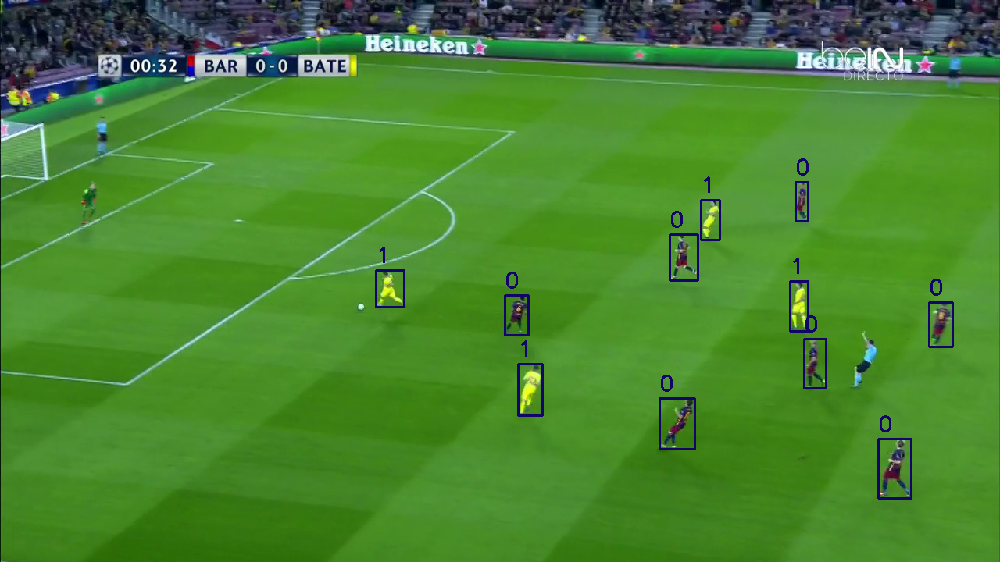

In [ ]:
import cv2
from google.colab.patches import cv2_imshow

result = results[0]
img = result.orig_img.copy()
i = 0
for box in result.boxes:
  label = int(box.cls.numpy()[0])

  if label == 0:
    x1, y1, x2, y2 = map(int, box.xyxy[0].numpy())

    # Draw the bounding box and label
    cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[int(label)], 2)
    team = kits_kmeans.labels_[i]
    cv2.putText(img, str(team), (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[int(label)], 2)
    i += 1

cv2_imshow(img);

The next step is to find out which team is "Team Left" and which one is "Team Right", this is performed by finding out the average bounding box x-axis position of each team and then labeling the team with the lower x value as "Team Left" and labeling the other team as "Team Right"

Team Left is Team 1


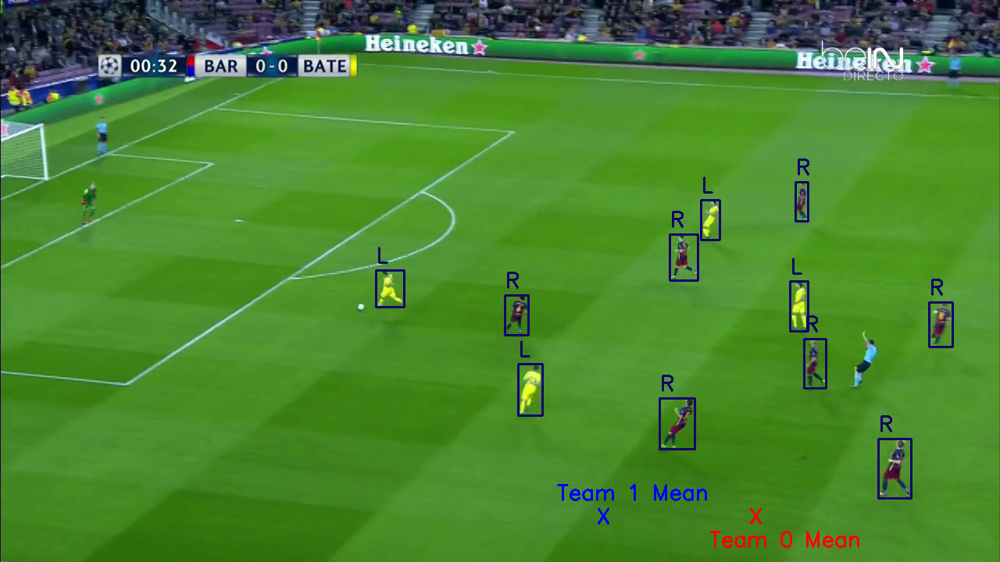

In [ ]:
img = result.orig_img.copy()

team_0 = []
team_1 = []

i = 0
team_left = 0
for box in result.boxes:
  label = int(box.cls.numpy()[0])

  if label == 0:
    x1, y1, x2, y2 = map(int, box.xyxy[0].numpy())

    # Draw the bounding box and label
    team = kits_kmeans.labels_[i]
    if team==0:
      team_0.append(np.array([x1]))
    else:
      team_1.append(np.array([x1]))
    i += 1

if (np.mean(team_1) < np.mean(team_0)):
  team_left = 1

i = 0
for box in result.boxes:
  label = int(box.cls.numpy()[0])

  if label == 0:
    x1, y1, x2, y2 = map(int, box.xyxy[0].numpy())
    team = kits_kmeans.labels_[i]
    cv2.rectangle(img, (x1, y1), (x2, y2), box_colors[int(label)], 2)
    cv2.putText(img, "L" if team==team_left else "R", (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9,
                box_colors[int(label)], 2)
    i += 1

cv2.putText(img, "X", (np.mean(team_0).astype(int), img.shape[0] - 50), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
cv2.putText(img, "Team 0 Mean", (np.mean(team_0).astype(int) - 50, img.shape[0] - 20), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 0, 255), 2)
cv2.putText(img, "X", (np.mean(team_1).astype(int), img.shape[0] - 50), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)
cv2.putText(img, "Team 1 Mean", (np.mean(team_1).astype(int) - 50, img.shape[0] - 80), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

print("Team Left is Team", team_left)
cv2_imshow(img);

# `06` Testing the model on Videos

Downloading the video test cases

In [ ]:
!gdown 13T68qyKVBDNxzby8nTXOUYIWE-Aml6M9
!gdown 164lzTf2lWjB7Zd1nPhak7PJvVEJ2eX_M
!gdown 13dgWxD7nIHxaK3bm_MrH2FLcCcywONcQ

Downloading...
From: https://drive.google.com/uc?id=13T68qyKVBDNxzby8nTXOUYIWE-Aml6M9
To: /content/ArsTot.mp4
100% 98.0M/98.0M [00:01<00:00, 57.5MB/s]
Downloading...
From: https://drive.google.com/uc?id=164lzTf2lWjB7Zd1nPhak7PJvVEJ2eX_M
To: /content/wimbeldon2.mp4
100% 39.6M/39.6M [00:00<00:00, 103MB/s] 
Downloading...
From: https://drive.google.com/uc?id=13dgWxD7nIHxaK3bm_MrH2FLcCcywONcQ
To: /content/CityUtdR.mp4
100% 3.45M/3.45M [00:00<00:00, 69.5MB/s]


Writing all the previous steps as functions for easier use with videos

In [ ]:
def get_grass_color(img):
    """
    Finds the color of the grass in the background of the image

    Args:
        img: np.array object of shape (WxHx3) that represents the BGR value of the
        frame pixels .

    Returns:
        grass_color
            Tuple of the BGR value of the grass color in the image
    """
    # Convert image to HSV color space
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

    # Define range of green color in HSV
    lower_green = np.array([30, 40, 40])
    upper_green = np.array([80, 255, 255])

    # Threshold the HSV image to get only green colors
    mask = cv2.inRange(hsv, lower_green, upper_green)

    # Calculate the mean value of the pixels that are not masked
    masked_img = cv2.bitwise_and(img, img, mask=mask)
    grass_color = cv2.mean(img, mask=mask)
    return grass_color[:3]

In [ ]:
def get_players_boxes(result):
  """
  Finds the images of the players in the frame and their bounding boxes.

  Args:
      result: ultralytics.engine.results.Results object that contains all the
      result of running the object detection algroithm on the frame

  Returns:
      players_imgs
          List of np.array objects that contain the BGR values of the cropped
          parts of the image that contains players.
      players_boxes
          List of ultralytics.engine.results.Boxes objects that contain various
          information about the bounding boxes of the players found in the image.
  """
  players_imgs = []
  players_boxes = []
  for box in result.boxes:
    label = int(box.cls.numpy()[0])
    if label == 0:
      x1, y1, x2, y2 = map(int, box.xyxy[0].numpy())
      player_img = result.orig_img[y1: y2, x1: x2]
      players_imgs.append(player_img)
      players_boxes.append(box)
  return players_imgs, players_boxes

In [ ]:
def get_kits_colors(players, grass_hsv=None, frame=None):
  """
  Finds the kit colors of all the players in the current frame

  Args:
      players: List of np.array objects that contain the BGR values of the image
      portions that contain players.
      grass_hsv: tuple that contain the HSV color value of the grass color of
      the image background.

  Returns:
      kits_colors
          List of np.array objects that contain the BGR values of the kits color
          of all the players in the current frame
  """
  kits_colors = []
  if grass_hsv is None:
	  grass_color = get_grass_color(frame)
	  grass_hsv = cv2.cvtColor(np.uint8([[list(grass_color)]]), cv2.COLOR_BGR2HSV)

  for player_img in players:
      # Convert image to HSV color space
      hsv = cv2.cvtColor(player_img, cv2.COLOR_BGR2HSV)

      # Define range of green color in HSV
      lower_green = np.array([grass_hsv[0, 0, 0] - 10, 40, 40])
      upper_green = np.array([grass_hsv[0, 0, 0] + 10, 255, 255])

      # Threshold the HSV image to get only green colors
      mask = cv2.inRange(hsv, lower_green, upper_green)

      # Bitwise-AND mask and original image
      mask = cv2.bitwise_not(mask)
      upper_mask = np.zeros(player_img.shape[:2], np.uint8)
      upper_mask[0:player_img.shape[0]//2, 0:player_img.shape[1]] = 255
      mask = cv2.bitwise_and(mask, upper_mask)

      kit_color = np.array(cv2.mean(player_img, mask=mask)[:3])

      kits_colors.append(kit_color)
  return kits_colors

In [ ]:
def get_kits_classifier(kits_colors):
  """
  Creates a K-Means classifier that can classify the kits accroding to their BGR
  values into 2 different clusters each of them represents one of the teams

  Args:
      kits_colors: List of np.array objects that contain the BGR values of
      the colors of the kits of the players found in the current frame.

  Returns:
      kits_kmeans
          sklearn.cluster.KMeans object that can classify the players kits into
          2 teams according to their color..
  """
  kits_kmeans = KMeans(n_clusters=2)
  kits_kmeans.fit(kits_colors);
  return kits_kmeans

In [ ]:
def classify_kits(kits_classifer, kits_colors):
  """
  Classifies the player into one of the two teams according to the player's kit
  color

  Args:
      kits_classifer: sklearn.cluster.KMeans object that can classify the
      players kits into 2 teams according to their color.
      kits_colors: List of np.array objects that contain the BGR values of
      the colors of the kits of the players found in the current frame.

  Returns:
      team
          np.array object containing a single integer that carries the player's
          team number (0 or 1)
  """
  team = kits_classifer.predict(kits_colors)
  return team

In [ ]:
def get_left_team_label(players_boxes, kits_colors, kits_clf):
  """
  Finds the label of the team that is on the left of the screen

  Args:
      players_boxes: List of ultralytics.engine.results.Boxes objects that
      contain various information about the bounding boxes of the players found
      in the image.
      kits_colors: List of np.array objects that contain the BGR values of
      the colors of the kits of the players found in the current frame.
      kits_clf: sklearn.cluster.KMeans object that can classify the players kits
      into 2 teams according to their color.
  Returns:
      left_team_label
          Int that holds the number of the team that's on the left of the image
          either (0 or 1)
  """
  left_team_label = 0
  team_0 = []
  team_1 = []

  for i in range(len(players_boxes)):
    x1, y1, x2, y2 = map(int, players_boxes[i].xyxy[0].numpy())

    team = classify_kits(kits_clf, [kits_colors[i]]).item()
    if team==0:
      team_0.append(np.array([x1]))
    else:
      team_1.append(np.array([x1]))

  team_0 = np.array(team_0)
  team_1 = np.array(team_1)

  if np.average(team_0) - np.average(team_1) > 0:
    left_team_label = 1

  return left_team_label

To use the algorithm on a video, first we have to read the video frames and run the object detection model inference over each one of them.
\
I used the first frame to get all the initial information required including the mean grass color in the background, the classifier that can classify the two teams, and the label of "Team Left".
\
Then for each frame, I used this information to isolate the players from their background and get their kit color, then use these kits to classify the players into one of the two teams and label them into "Left" or "Right" according to their team label.
\
Usually Goalkeepers only appear in front of their goals so their position is almost fixed, so "GoalKeepers" are classified into "Left" or "Right" according to their position in the frame.
\
Finally, the annotated frame is saved to the disk.

In [ ]:
labels = ["Player-L", "Player-R", "GK-L", "GK-R", "Ball", "Main Ref", "Side Ref", "Staff"]
box_colors = {
    "0": (150, 50, 50),
    "1": (37, 47, 150),
    "2": (41, 248, 165),
    "3": (166, 196, 10),
    "4": (155, 62, 157),
    "5": (123, 174, 213),
    "6": (217, 89, 204),
    "7": (22, 11, 15)
}

In [ ]:
cap = cv2.VideoCapture("/content/CityUtdR.mp4")

height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))

fourcc = cv2.VideoWriter_fourcc(*'MP4V')
output_video = cv2.VideoWriter('/content/drive/MyDrive/FootballObjectDetetction/Output/CityUtdR.mp4',
                         fourcc,
                         30.0,
                         (width, height))

kits_clf = None
left_team_label = 0
grass_hsv = None


while cap.isOpened():
  # Read a frame from the video
  success, frame = cap.read()

  current_frame_idx = cap.get(cv2.CAP_PROP_POS_FRAMES)
  if success:

    # Run YOLOv8 inference on the frame
    annotated_frame = cv2.resize(frame, (width, height))
    result = model(annotated_frame, conf=0.5, verbose=False)[0]

    # Get the players boxes and kit colors
    players_imgs, players_boxes = get_players_boxes(result)
    kits_colors = get_kits_colors(players_imgs, grass_hsv, annotated_frame)

    # Run on the first frame only
    if current_frame_idx == 1:
      kits_clf = get_kits_classifier(kits_colors)
      left_team_label = get_left_team_label(players_boxes, kits_colors, kits_clf)
      grass_color = get_grass_color(result.orig_img)
      grass_hsv = cv2.cvtColor(np.uint8([[list(grass_color)]]), cv2.COLOR_BGR2HSV)

    for box in result.boxes:
      label = int(box.cls.numpy()[0])
      x1, y1, x2, y2 = map(int, box.xyxy[0].numpy())

      # If the box contains a player, find to which team he belongs
      if label == 0:
        kit_color = get_kits_colors([result.orig_img[y1: y2, x1: x2]], grass_hsv)
        team = classify_kits(kits_clf, kit_color)
        if team == left_team_label:
          label = 0
        else:
          label = 1

      # If the box contains a Goalkeeper, find to which team he belongs
      elif label == 1:
        if x1 < 0.5 * width:
          label = 2
        else:
          gk_label = 3

      # Increase the label by 2 because of the two add labels "Player-L", "GK-L"
      else:
        label = label + 2

      cv2.rectangle(annotated_frame, (x1, y1), (x2, y2), box_colors[str(label)], 2)
      cv2.putText(annotated_frame, labels[label], (x1 - 30, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, box_colors[str(label)], 2)

    # Write the annotated frame
    output_video.write(annotated_frame)
  else:
      # Break the loop if the end of the video is reached
      break

cv2.destroyAllWindows()
output_video.release()
cap.release()